# land initialization diagnostics
variables: snow depth, and soilwater_10cm in LENS, CESM2 S2S and SMYLE
precipitation in ERA5 right before the heatwave


In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LongitudeFormatter, LatitudeFormatter
import cartopy.feature as cfeature
import cf_units as cf
from geocat.viz import util as gvutil

In [2]:
import xesmf as xe

In [3]:
from cartopy.mpl.gridliner import LongitudeFormatter, LatitudeFormatter
import cartopy.feature as cfeature

In [4]:
import dask
from dask_jobqueue import PBSCluster
from dask.distributed import Client


In [5]:
cluster = PBSCluster(
    cores=1, # The number of cores you want
    memory='25GB', # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='/glade/derecho/scratch/huili7/', # Use your local directory
    resource_spec='select=1:ncpus=1:mem=25GB', # Specify resources
    project='P93300313', # Input your project ID here
    walltime='02:00:00', # Amount of wall time
    interface='ext', # Interface to use
)

# Scale up
cluster.scale(12)

# Change your url to the dask dashboard so you can see it
dask.config.set({'distributed.dashboard.link':'https://jupyterhub.hpc.ucar.edu/stable/user/huili7/proxy/127.0.0.1:8787/status'})




/glade/work/huili7/miniconda3/envs/workstation/lib/python3.10/site-packages/dask_jobqueue/pbs.py:82: FutureWarning: project has been renamed to account as this kwarg was used wit -A option. You are still using it (please also check config files). If you did not set account yet, project will be respected for now, but it will be removed in a future release. If you already set account, project is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/glade/work/huili7/miniconda3/envs/workstation/lib/python3.10/site-packages/dask_jobqueue/pbs.py:82: FutureWarning: project has been renamed to account as this kwarg was used wit -A option. You are still using it (please also check config files). If you did not set account yet, project will be respected for now, but it will be removed in a future release. If you already set account, project is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)


In [6]:
# Setup your client
client = Client(cluster)

In [7]:
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/huili7/proxy/127.0.0.1:8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/huili7/proxy/127.0.0.1:8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.100:35791,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/huili7/proxy/127.0.0.1:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [8]:
#client.shutdown()

## Define functions

In [11]:
## define plotting funcition

def var_plot_panels(variable, nrows, ncols, i, levels, title,colormap):
    ax1= fig.add_subplot(nrows, ncols, i, projection=ccrs.PlateCarree())
    ax1.add_feature(cfeature.COASTLINE, linewidth=4, zorder=2)
    contour = variable.plot.contourf(ax=ax1,
                           transform=ccrs.PlateCarree(),
                           levels=levels,
                            cmap = colormap,#'jet', #'viridis',
                           extend='both',
                           add_colorbar=False,
                           add_labels=False)
    cb = plt.colorbar(contour,
                     ax=ax1,
#                     ticks=ticks,
                     orientation='horizontal',
                     pad=0.1,
                     drawedges=True,
                     shrink=0.7,
                    # labelsize=20
                    )
        
    cb.ax.tick_params(labelsize=18)


    gvutil.set_titles_and_labels(ax1,maintitle=title,
                             maintitlefontsize=25)

    gvutil.set_axes_limits_and_ticks(ax1, xlim=(-140,-70),
                                    ylim=(20, 80),
                                    xticks=np.linspace(-140,-70, 8),
                                    yticks=np.linspace(20, 80, 7))

    gvutil.add_major_minor_ticks(ax1, labelsize=18)
    gvutil.add_lat_lon_ticklabels(ax1)


In [78]:
## define plotting funcition

def var_plot_panels_glob(variable, nrows, ncols, i, levels, title,colormap):
    variable = gvutil.xr_add_cyclic_longitudes(variable, "lon")
    ax1= fig.add_subplot(nrows, ncols, i, projection=ccrs.PlateCarree())
    ax1.add_feature(cfeature.COASTLINE, linewidth=1, zorder=2)
    contour = variable.plot.contourf(ax=ax1,
                           transform=ccrs.PlateCarree(),
                           levels=levels,
                            cmap = colormap,
                           extend='both',
                           add_colorbar=False,
                           add_labels=False)
    cb = plt.colorbar(contour,
                     ax=ax1,
#                     ticks=ticks,
                     orientation='horizontal',
                     pad=0.05,
                     drawedges=True,
                     shrink=0.7,
                    # labelsize=20
                    )
        
    cb.ax.tick_params(labelsize=18)


    gvutil.set_titles_and_labels(ax1,maintitle=title,
                             maintitlefontsize=25)


    gvutil.add_major_minor_ticks(ax1, labelsize=18)
    gvutil.add_lat_lon_ticklabels(ax1)


## 1. READ IN DATA

### read in ERA5 

In [30]:
# precipitation
#dsp = xr.open_dataset('/glade/p/cgd/amp/zarzycki/DATM_FORCING/ERA5/Precip6Hrly/CMZERA5.v0.c2021.0.5d.Prec.2021-06.nc')#,chunks={'time':120})
dsp = xr.open_dataset('ERA5_precip_202106.nc')
era5_precip = dsp.mtpr

In [31]:
era5_precip

<xarray.DataArray 'mtpr' (time: 72, latitude: 721, longitude: 1440)>
[74753280 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 2021-06-19 ... 2021-06-21T23:00:00
Attributes:
    units:      kg m**-2 s**-1
    long_name:  Mean total precipitation rate

In [33]:
era5_precip_daily = era5_precip.groupby('time.day').mean()

In [34]:
 # unit kg/m2/s to mm/day -> kg/m2/s * 1e-3 * 1e3 * 24 * 3600
# (kg/m2/s  /   rho(kg/m3) = m/s, m/s * 1000 * 24 * 3600)

era5_precip_daily = era5_precip_daily * 24 * 3600

In [ ]:
era5_precip_daily= gvutil.xr_add_cyclic_longitudes(era5_precip_daily, "longitude")

In [24]:
#dsc = xr.open_dataset('CMZERA5_2020-2021_monmean.nc')


### Read in GLDAS

In [10]:
dsg = xr.open_dataset('GLDAS_NOAH025_M.A202001-202102.nc')

### read in GPCP precipitation

In [17]:
dsgpcp = xr.open_mfdataset('gpcp_v01r03_daily_d2021*.nc',
                           combine="nested",
                         concat_dim='time')
dsgpcp

<xarray.Dataset>
Dimensions:      (latitude: 180, longitude: 360, time: 3, nv: 2)
Coordinates:
  * latitude     (latitude) float32 -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0
  * longitude    (longitude) float32 0.0 1.0 2.0 3.0 ... 356.0 357.0 358.0 359.0
  * time         (time) datetime64[ns] 2021-06-19 2021-06-20 2021-06-21
Dimensions without coordinates: nv
Data variables:
    lat_bounds   (time, latitude, nv) float32 dask.array<chunksize=(1, 180, 2), meta=np.ndarray>
    lon_bounds   (time, longitude, nv) float32 dask.array<chunksize=(1, 360, 2), meta=np.ndarray>
    time_bounds  (time, nv) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
    precip       (time, latitude, longitude) float32 dask.array<chunksize=(1, 180, 360), meta=np.ndarray>
Attributes: (12/45)
    Conventions:                CF-1.6, ACDD 1.3
    title:                      Global Precipitation Climatatology Project (G...
    source:                     /data1/GPCP_CDR/GPCP_Output/1DD//bin/202106/s...
    references:                 Huffman et al. 1997, http://dx.doi.org/10.117...
    history:                    1) 2023-05-16T15:14:43Z, Dr. Jian-Jian Wang, ...
    Metadata_Conventions:       CF-1.6, Unidata Dataset Discovery v1.0, NOAA ...
    ...                         ...
    metadata_link:              gov.noaa.ncdc:XXXXX
    product_version:            v01r03
    platform:                   GOES (Geostationary Operational Environmental...
    sensor:                     Imager, AIRS > Atmospheric Infrared Sounder, ...
    spatial_resolution:         1 degree
    comment:                    Processing computer: eagle2.umd.edu

### read in LENS

In [18]:
lens_snowd = xr.open_dataset('/glade/campaign/cgd/cesm/CESM2-LE/timeseries/lnd/proc/tseries/month_1/SNOWDP/b.e21.BSSP370smbb.f09_g17.LE2-1301.016.clm2.h0.SNOWDP.201501-202412.nc')
lens_soil = xr.open_dataset('/glade/campaign/cgd/cesm/CESM2-LE/timeseries/lnd/proc/tseries/month_1/SOILWATER_10CM/b.e21.BSSP370smbb.f09_g17.LE2-1301.016.clm2.h0.SOILWATER_10CM.201501-202412.nc')
#lens_tbot =  xr.open_dataset('/glade/campaign/cgd/cesm/CESM2-LE/timeseries/lnd/proc/tseries/month_1/TBOT/b.e21.BSSP370smbb.f09_g17.LE2-1301.016.clm2.h0.TBOT.201501-202412.nc')
#lens_tskin =  xr.open_dataset('/glade/campaign/cgd/cesm/CESM2-LE/timeseries/lnd/proc/tseries/month_1/TSKIN/b.e21.BSSP370smbb.f09_g17.LE2-1301.016.clm2.h0.TSKIN.201501-202412.nc')
lens_snow =  xr.open_dataset('/glade/campaign/cgd/cesm/CESM2-LE/timeseries/lnd/proc/tseries/month_1/SNOW/b.e21.BSSP370smbb.f09_g17.LE2-1301.016.clm2.h0.SNOW.201501-202412.nc')
lens_snowliq =  xr.open_dataset('/glade/campaign/cgd/cesm/CESM2-LE/timeseries/lnd/proc/tseries/month_1/SNOWLIQ/b.e21.BSSP370smbb.f09_g17.LE2-1301.016.clm2.h0.SNOWLIQ.201501-202412.nc')

In [19]:
lens = xr.Dataset()
lens['SOILWATER_10cm']= lens_soil['SOILWATER_10CM']#.groupby('time.month').mean()
lens['SNOW_DEPTH']= lens_snowd['SNOWDP']#.groupby('time.month').mean()
#lens['TBOT']= lens_tbot['TBOT']
#lens['TSKIN']= lens_tskin['TSKIN']
lens['SNOW']= lens_snow['SNOW']
lens['SNOWLIQ']= lens_snowliq['SNOWLIQ']


### read in mpas60 10 year run

In [20]:
dsr = xr.open_dataset('regridded_ECHO-spinup_20210208_0120.nc',chunks={'time':12})
dsr

<xarray.Dataset>
Dimensions:         (time: 120, lat: 719, lon: 1440)
Coordinates:
  * time            (time) object 2011-03-01 00:00:00 ... 2021-02-01 00:00:00
  * lat             (lat) float64 -89.75 -89.5 -89.25 -89.0 ... 89.25 89.5 89.75
  * lon             (lon) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    TBOT            (time, lat, lon) float32 dask.array<chunksize=(12, 719, 1440), meta=np.ndarray>
    TSKIN           (time, lat, lon) float32 dask.array<chunksize=(12, 719, 1440), meta=np.ndarray>
    SNOW_DEPTH      (time, lat, lon) float32 dask.array<chunksize=(12, 719, 1440), meta=np.ndarray>
    SOILWATER_10CM  (time, lat, lon) float32 dask.array<chunksize=(12, 719, 1440), meta=np.ndarray>
    SNOWDP          (time, lat, lon) float32 dask.array<chunksize=(12, 719, 1440), meta=np.ndarray>

### read in CESM2 S2S

In [21]:
ds2s = xr.open_mfdataset('/glade/campaign/cesm/development/cross-wg/S2S/CESM2/S2SHINDCASTS/lnd/cesm2cam6v2.2021-02-01*clm2.h0.2021-02-01-00000.nc',
                         combine='nested',
                        concat_dim='member')
ds2s = ds2s.mean('member')

In [22]:
ds2s

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, lon: 288,
                     lat: 192, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2021-02-01 00:00:00 ... 2021-03-18 00:00:00
  * lon             (lon) float32 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * lat             (lat) float32 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
Dimensions without coordinates: levsoi
Data variables: (12/53)
    mcdate          (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    mcsec           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    mdcur           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    mscur           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    nstep           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    area            (lat, lon) float32 dask.array<chunksize=(192, 288), meta=np.ndarray>
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 dask.array<chunksize=(46, 20, 192, 288), meta=np.ndarray>
    SOILWATER_10CM  (time, lat, lon) float32 dask.array<chunksize=(46, 192, 288), meta=np.ndarray>
    TLAI            (time, lat, lon) float32 dask.array<chunksize=(46, 192, 288), meta=np.ndarray>
    TOTECOSYSC      (time, lat, lon) float32 dask.array<chunksize=(46, 192, 288), meta=np.ndarray>
    TOTVEGC         (time, lat, lon) float32 dask.array<chunksize=(46, 192, 288), meta=np.ndarray>
    TWS             (time, lat, lon) float32 dask.array<chunksize=(46, 192, 288), meta=np.ndarray>

### read in SMYLE trendy

In [23]:
dtrendy = xr.open_dataset('/glade/campaign/cesm/development/espwg/SMYLE/initial_conditions/CLM5_SMYLE-JRA55-Extension/hist/smyle_Transient_201801.clm2.h0.2021-02.nc')
dtrendy

<xarray.Dataset>
Dimensions:                          (levgrnd: 25, levlak: 10, levdcmp: 25,
                                      time: 1, hist_interval: 2, lon: 288,
                                      lat: 192, levsoi: 20, cft: 64,
                                      glc_nec: 10, ltype: 9, natpft: 15,
                                      nvegwcs: 4)
Coordinates:
  * levgrnd                          (levgrnd) float32 0.01 0.04 ... 28.87 42.0
  * levlak                           (levlak) float32 0.05 0.6 ... 34.33 44.78
  * levdcmp                          (levdcmp) float32 0.01 0.04 ... 28.87 42.0
  * time                             (time) object 2021-03-01 00:00:00
  * lon                              (lon) float32 0.0 1.25 2.5 ... 357.5 358.8
  * lat                              (lat) float32 -90.0 -89.06 ... 89.06 90.0
Dimensions without coordinates: hist_interval, levsoi, cft, glc_nec, ltype,
                                natpft, nvegwcs
Data variables: (12/481)
    mcdate                           (time) int32 ...
    mcsec                            (time) int32 ...
    mdcur                            (time) int32 ...
    mscur                            (time) int32 ...
    nstep                            (time) int32 ...
    time_bounds                      (time, hist_interval) object ...
    ...                               ...
    XSMRPOOL                         (time, lat, lon) float32 ...
    XSMRPOOL_RECOVER                 (time, lat, lon) float32 ...
    ZBOT                             (time, lat, lon) float32 ...
    ZWT                              (time, lat, lon) float32 ...
    ZWT_CH4_UNSAT                    (time, lat, lon) float32 ...
    ZWT_PERCH                        (time, lat, lon) float32 ...
Attributes: (12/102)
    title:                                     CLM History file information
    comment:                                   NOTE: None of the variables ar...
    Conventions:                               CF-1.0
    history:                                   created on 08/13/21 23:10:54
    source:                                    Community Land Model CLM4.0
    hostname:                                  cheyenne
    ...                                        ...
    cft_irrigated_tropical_corn:               62
    cft_tropical_soybean:                      63
    cft_irrigated_tropical_soybean:            64
    time_period_freq:                          month_1
    Time_constant_3Dvars_filename:             ./smyle_Transient_201801.clm2....
    Time_constant_3Dvars:                      ZSOI:DZSOI:WATSAT:SUCSAT:BSW:H...

## 2. Diagnose ERA5 precipitation for the heatwave

In [28]:
dsgpcp_precip = dsgpcp.precip
dsgpcp_regrid = dsgpcp_precip.interp(latitude=era5_precip.latitude,longitude = era5_precip.longitude)
dsgpcp_regrid  = gvutil.xr_add_cyclic_longitudes(dsgpcp_regrid, "longitude")

In [26]:
dsgpcp_regrid

<xarray.DataArray (time: 3, latitude: 721, longitude: 1441)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [0.03766322, 0.03765423, 0.03764524, ...,        nan,
                nan, 0.03766322],
        [0.05649483, 0.05648135, 0.05646786, ...,        nan,
                nan, 0.05649483],
        [0.07532644, 0.07530846, 0.07529049, ...,        nan,
                nan, 0.07532644]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [0.        , 0.        , 0.        , ...,        nan,
                nan, 0.        ],
        [0.        , 0.        , 0.        , ...,        nan,
                nan, 0.        ],
        [0.        , 0.        , 0.        , ...,        nan,
                nan, 0.        ]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [0.34394926, 0.34386715, 0.34378505, ...,        nan,
                nan, 0.34394926],
        [0.51592386, 0.5158007 , 0.5156776 , ...,        nan,
                nan, 0.51592386],
        [0.6878985 , 0.6877343 , 0.6875701 , ...,        nan,
                nan, 0.6878985 ]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 2021-06-19 2021-06-20 2021-06-21
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8 360.0
Attributes:
    long_name:      NOAA Climate Data Record (CDR) of Daily GPCP Satellite-Ga...
    standard_name:  lwe_precipitation_rate
    units:          mm/day
    valid_range:    [  0. 100.]
    cell_methods:   area: mean time: mean

In [36]:
dsgpcp_precip[1].min()

<xarray.DataArray 'precip' ()>
dask.array<_nanmin_skip-aggregate, shape=(), dtype=float32, chunksize=(), chunktype=numpy.ndarray>
Coordinates:
    time     datetime64[ns] 2021-06-20

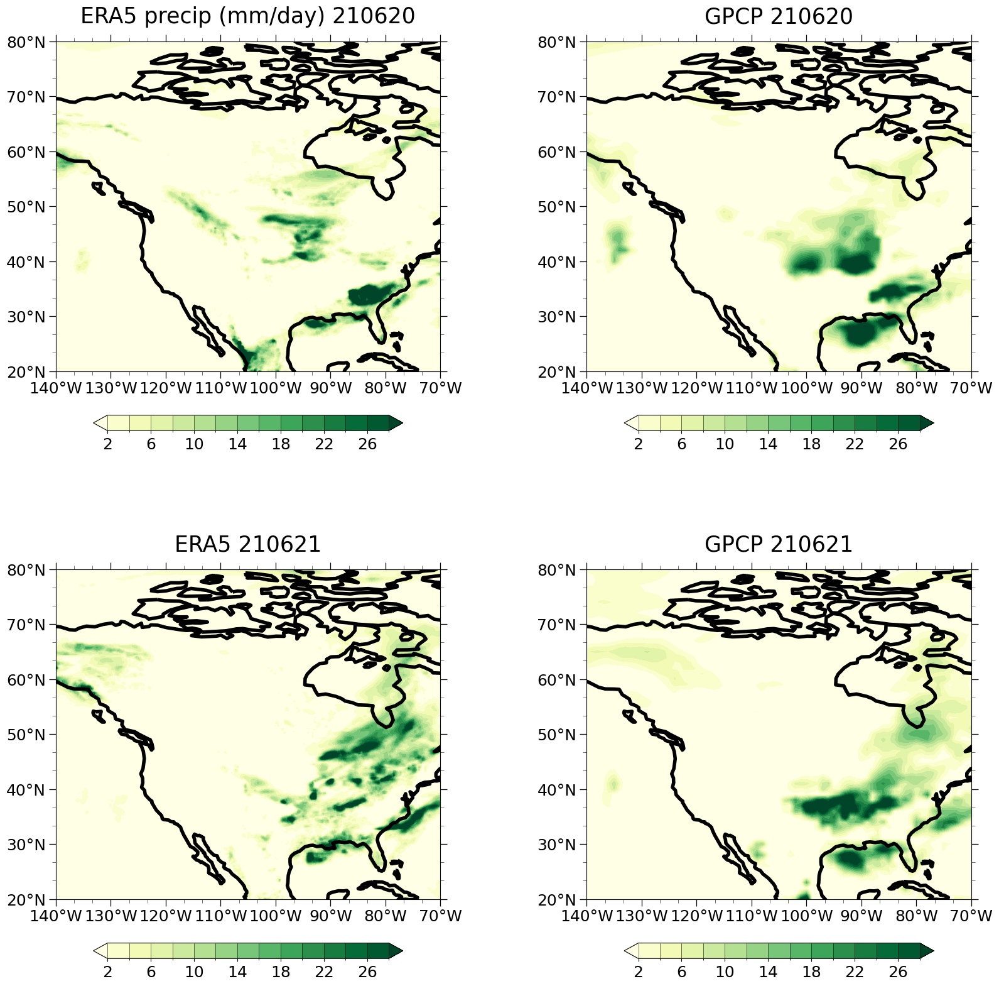

In [51]:

fig=plt.figure(figsize=(20,20))
levels=np.arange(2,30,2)
var_plot_panels(era5_precip_daily[1],2,2,1, levels,'ERA5 precip (mm/day) 210620','YlGn')
var_plot_panels(dsgpcp_regrid.isel(time=1),2,2,2, levels,'GPCP 210620','YlGn')
var_plot_panels(era5_precip_daily[2],2,2,3, levels,'ERA5 210621','YlGn')
var_plot_panels(dsgpcp_regrid.isel(time=2),2,2,4, levels,'GPCP 210621','YlGn')

In [39]:
precip_diff = era5_precip_daily.copy(data=(era5_precip_daily.data - dsgpcp_regrid.data))

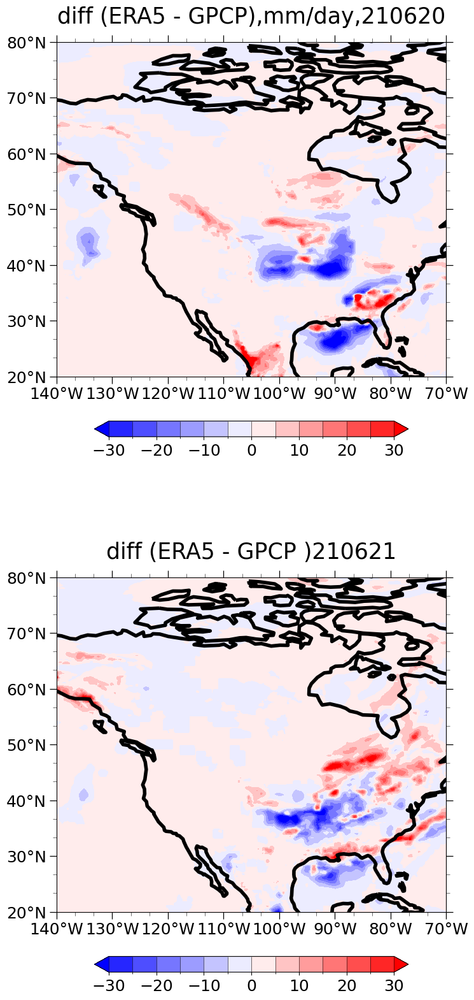

In [49]:
fig=plt.figure(figsize=(20,20))
levels=np.arange(-30,35,5)
var_plot_panels(precip_diff[1],2,2,1, levels,'diff (ERA5 - GPCP),mm/day,210620','bwr')
var_plot_panels(precip_diff[2],2,2,3, levels,'diff (ERA5 - GPCP )210621','bwr')


## 3. Snow depth diagnoistics

### ne30

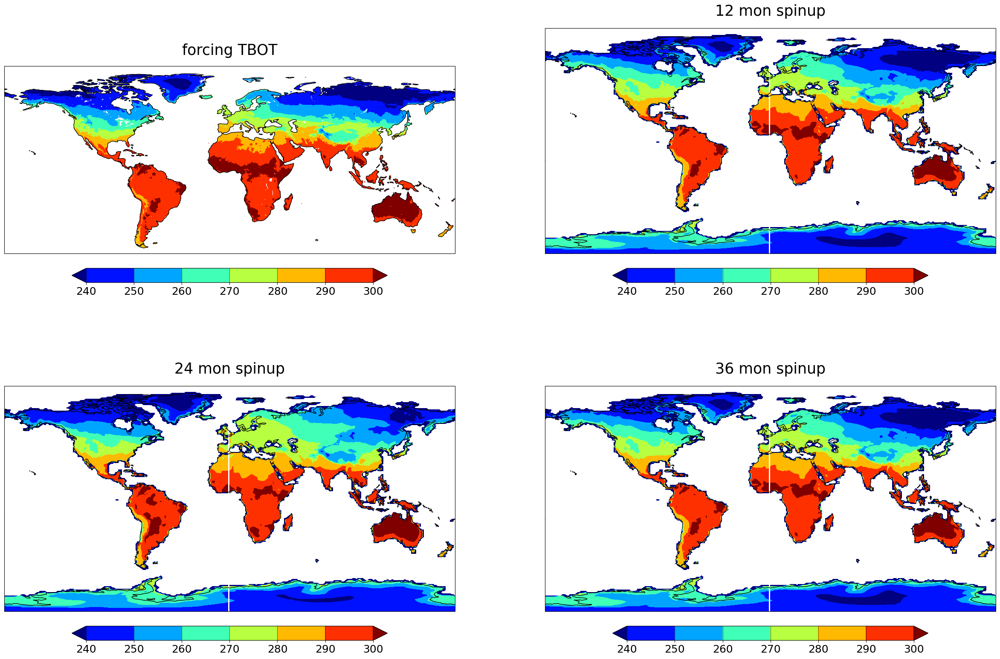

In [90]:
levels=np.arange(240,310,10)
fig=plt.figure(figsize=(30,20))

var_plot_panels_glob(dsg.isel(time=13),'AvgSurfT_inst',2,2,1, levels,'forcing TBOT')
var_plot_panels_glob(dsne30.isel(time=11),'TBOT',2,2,2, levels,'12 mon spinup')
var_plot_panels_glob(dsne30.isel(time=23),'TBOT',2,2,3, levels,'24 mon spinup')
var_plot_panels_glob(dsne30.isel(time=35),'TBOT',2,2,4, levels,'36 mon spinup')


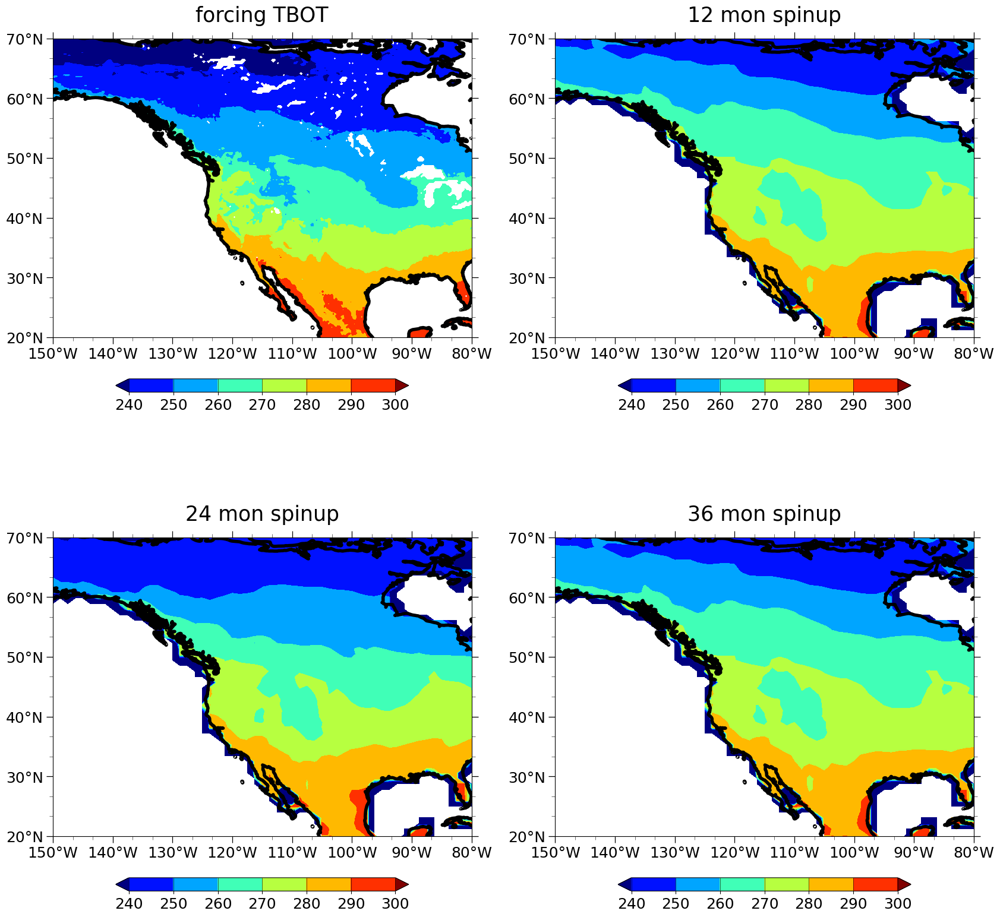

In [88]:
levels=np.arange(240,310,10)
fig=plt.figure(figsize=(20,20))

var_plot_panels(dsg.isel(time=13),'AvgSurfT_inst',2,2,1, levels,'forcing TBOT')
var_plot_panels(dsne30.isel(time=11),'TBOT',2,2,2, levels,'12 mon spinup')
var_plot_panels(dsne30.isel(time=23),'TBOT',2,2,3, levels,'24 mon spinup')
var_plot_panels(dsne30.isel(time=35),'TBOT',2,2,4, levels,'36 mon spinup')


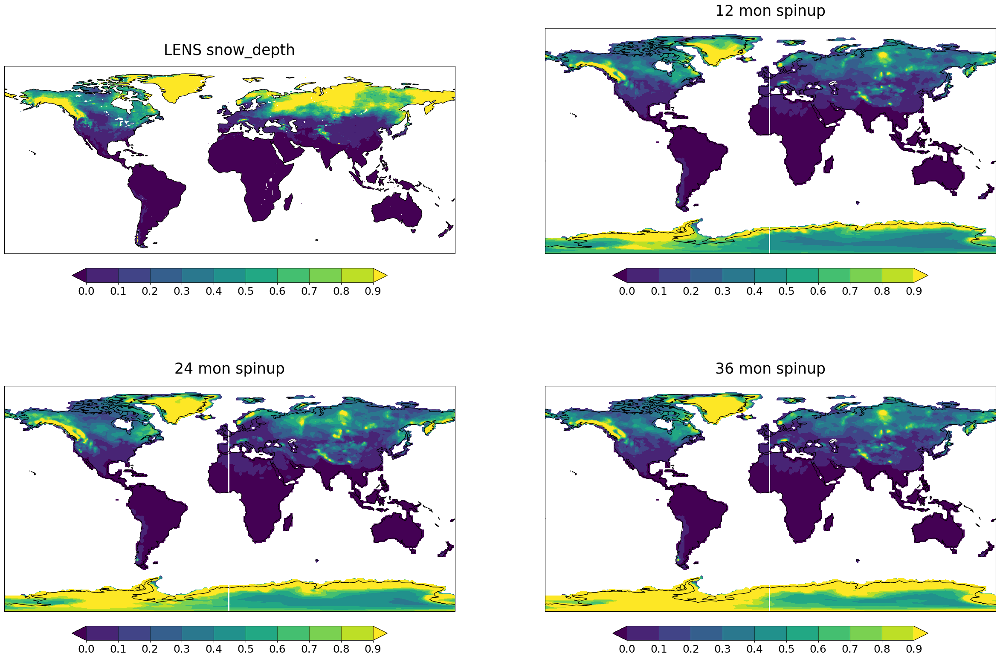

In [41]:
levels=np.arange(0,1,0.1)
fig=plt.figure(figsize=(30,20))

var_plot_panels_glob(dsg.isel(time=13),'SnowDepth_inst',2,2,1, levels,'LENS snow_depth')
var_plot_panels_glob(dsne30.isel(time=11),'SNOW_DEPTH',2,2,2, levels,'12 mon spinup')
var_plot_panels_glob(dsne30.isel(time=23),'SNOW_DEPTH',2,2,3, levels,'24 mon spinup')
var_plot_panels_glob(dsne30.isel(time=35),'SNOW_DEPTH',2,2,4, levels,'36 mon spinup')


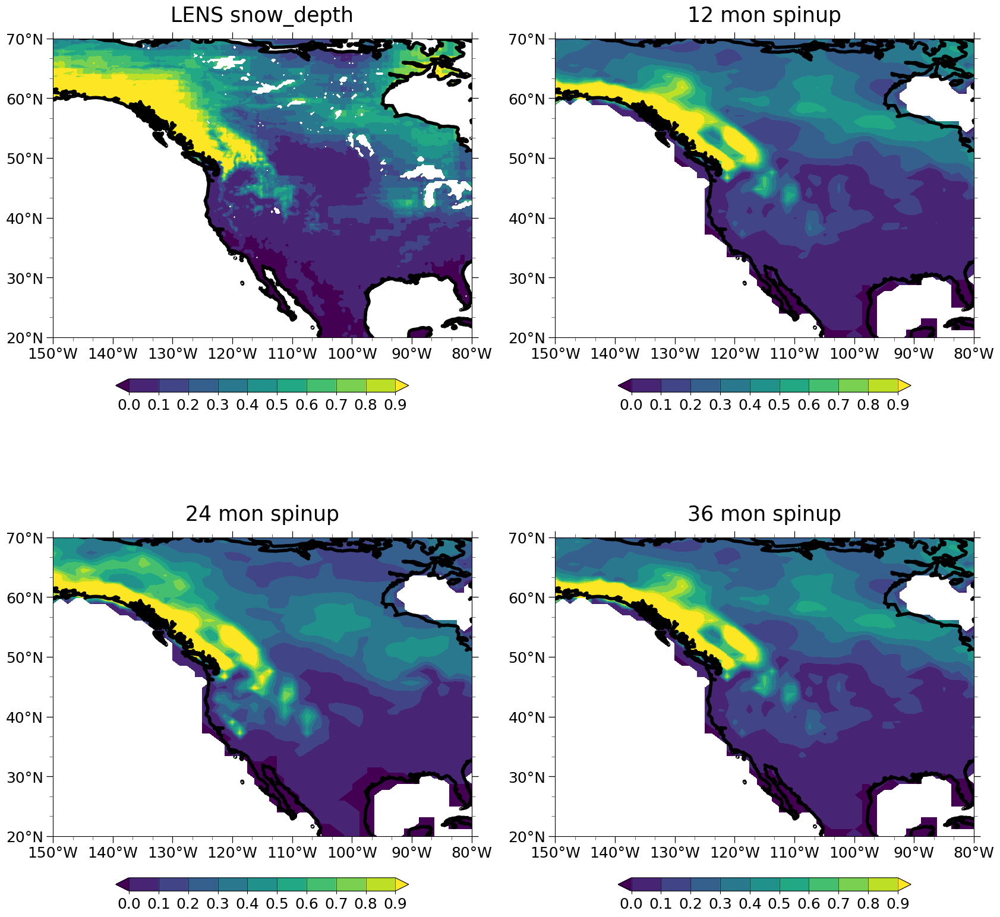

In [42]:
levels=np.arange(0,1,0.1)
fig=plt.figure(figsize=(20,20))

var_plot_panels(dsg.isel(time=13),'SnowDepth_inst',2,2,1, levels,'LENS snow_depth')
var_plot_panels(dsne30.isel(time=11),'SNOW_DEPTH',2,2,2, levels,'12 mon spinup')
var_plot_panels(dsne30.isel(time=23),'SNOW_DEPTH',2,2,3, levels,'24 mon spinup')
var_plot_panels(dsne30.isel(time=35),'SNOW_DEPTH',2,2,4, levels,'36 mon spinup')


### regrid

In [133]:
#dsg_roll = dsg.roll(lon = 720)
#dsg_roll['lon'] = dsg.lon+180

In [61]:
ds2s_regrid = ds2s.interp(lat=dsr.lat,lon = dsr.lon)
ds2s_regrid

<xarray.Dataset>
Dimensions:         (levgrnd: 25, levlak: 10, levdcmp: 25, time: 46, lat: 719,
                     lon: 1440, levsoi: 20)
Coordinates:
  * levgrnd         (levgrnd) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * levlak          (levlak) float32 0.05 0.6 2.1 4.6 ... 18.6 25.6 34.33 44.78
  * levdcmp         (levdcmp) float32 0.01 0.04 0.09 0.16 ... 19.48 28.87 42.0
  * time            (time) object 2021-02-01 00:00:00 ... 2021-03-18 00:00:00
  * lat             (lat) float64 -89.75 -89.5 -89.25 -89.0 ... 89.25 89.5 89.75
  * lon             (lon) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Dimensions without coordinates: levsoi
Data variables: (12/53)
    mcdate          (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    mcsec           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    mdcur           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    mscur           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    nstep           (time) float64 dask.array<chunksize=(46,), meta=np.ndarray>
    area            (lat, lon) float32 dask.array<chunksize=(719, 1440), meta=np.ndarray>
    ...              ...
    SOILLIQ         (time, levsoi, lat, lon) float32 dask.array<chunksize=(46, 20, 719, 1440), meta=np.ndarray>
    SOILWATER_10CM  (time, lat, lon) float32 dask.array<chunksize=(46, 719, 1440), meta=np.ndarray>
    TLAI            (time, lat, lon) float32 dask.array<chunksize=(46, 719, 1440), meta=np.ndarray>
    TOTECOSYSC      (time, lat, lon) float32 dask.array<chunksize=(46, 719, 1440), meta=np.ndarray>
    TOTVEGC         (time, lat, lon) float32 dask.array<chunksize=(46, 719, 1440), meta=np.ndarray>
    TWS             (time, lat, lon) float32 dask.array<chunksize=(46, 719, 1440), meta=np.ndarray>

In [67]:
dtrendy_regrid = dtrendy.interp(lat=dsr.lat,lon = dsr.lon)


In [226]:
#tbot_diff = dsr.TSKIN.copy(data = (dsr.TSKIN.data - dsg_regrid['AvgSurfT_inst'].isel(time=13).data))
#tsnow_diff = dsr.SNOW_DEPTH.copy(data= (dsr.SNOW_DEPTH.data - dsg_regrid['SnowDepth_inst'].isel(time=13).data))

In [65]:
ds2s_regrid_feb = ds2s_regrid.sel(time='2021-02').mean('time') #isel(time=slice(0,8)).mean('time')


In [68]:
dsr_feb = dsr.sel(time='2020-02').isel(time=0)

In [69]:
s2s_diff = xr.Dataset()
s2s_diff['SOILWATER_10cm'] = dsr_feb.SOILWATER_10CM.copy(data = (dsr_feb.SOILWATER_10CM.data - ds2s_regrid_feb.SOILWATER_10CM.data))
s2s_diff['SNOWDP'] = dsr_feb.SNOWDP.copy(data = (dsr_feb.SNOWDP.data - ds2s_regrid_feb.SNOWDP.data))

In [70]:
trendy_diff = xr.Dataset()
trendy_diff['SOILWATER_10cm'] = dsr_feb.SOILWATER_10CM.copy(data = (dsr_feb.SOILWATER_10CM.data - dtrendy_regrid.SOILWATER_10CM.isel(time=0).data))
trendy_diff['SNOW_DEPTH'] = dsr_feb.SNOWDP.copy(data = (dsr_feb.SNOWDP.data - dtrendy_regrid.SNOWDP.isel(time=0).data))

### temp

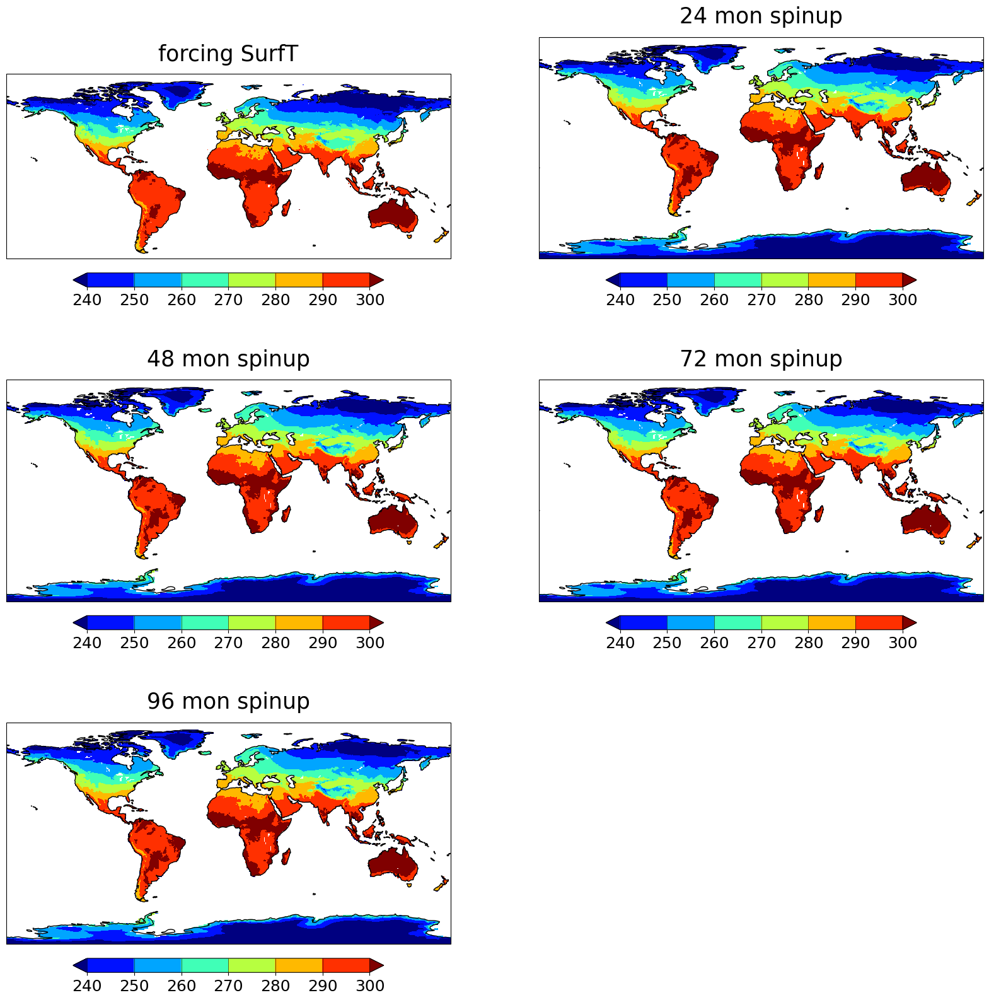

In [152]:
levels=np.arange(240,310,10)
fig=plt.figure(figsize=(20,20))

var_plot_panels_glob(dsg.isel(time=13),'AvgSurfT_inst',3,2,1, levels,'forcing SurfT')
var_plot_panels_glob(dsr.isel(time=24),'TSKIN',3,2,2, levels,'24 mon spinup')
var_plot_panels_glob(dsr.isel(time=48),'TSKIN',3,2,3, levels,'48 mon spinup')
var_plot_panels_glob(dsr.isel(time=72),'TSKIN',3,2,4, levels,'72 mon spinup')
var_plot_panels_glob(dsr.isel(time=96),'TSKIN',3,2,5, levels,'96 mon spinup')

plt.savefig('TBOT_spinup_glob.png')

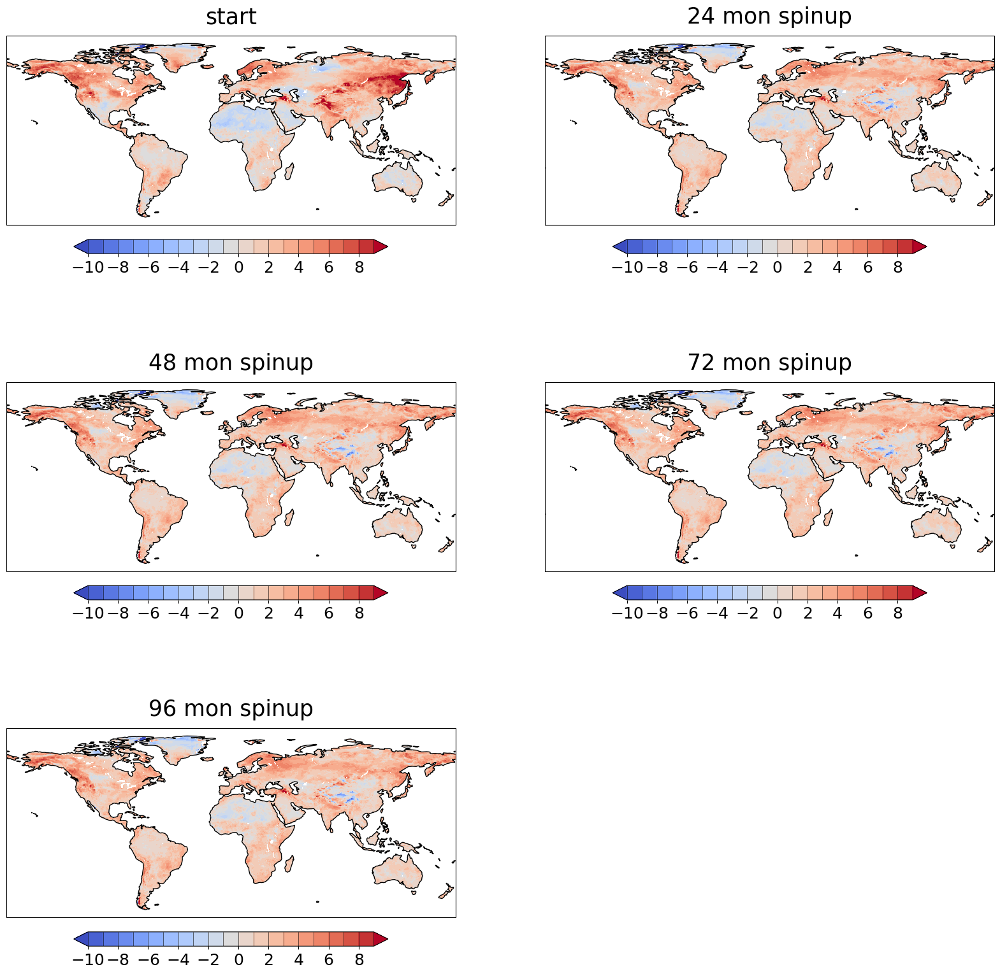

In [232]:
levels=np.arange(-10,10,1)
fig=plt.figure(figsize=(20,20))

var_plot_panels_glob(dsr_diff.isel(time=0),'TBOT',3,2,1, levels,'start')
var_plot_panels_glob(dsr_diff.isel(time=24),'TBOT',3,2,2, levels,'24 mon spinup')
var_plot_panels_glob(dsr_diff.isel(time=48),'TBOT',3,2,3, levels,'48 mon spinup')
var_plot_panels_glob(dsr_diff.isel(time=72),'TBOT',3,2,4, levels,'72 mon spinup')
var_plot_panels_glob(dsr_diff.isel(time=96),'TBOT',3,2,5, levels,'96 mon spinup')

plt.savefig('TBOT_spinup_glob_diff.png')

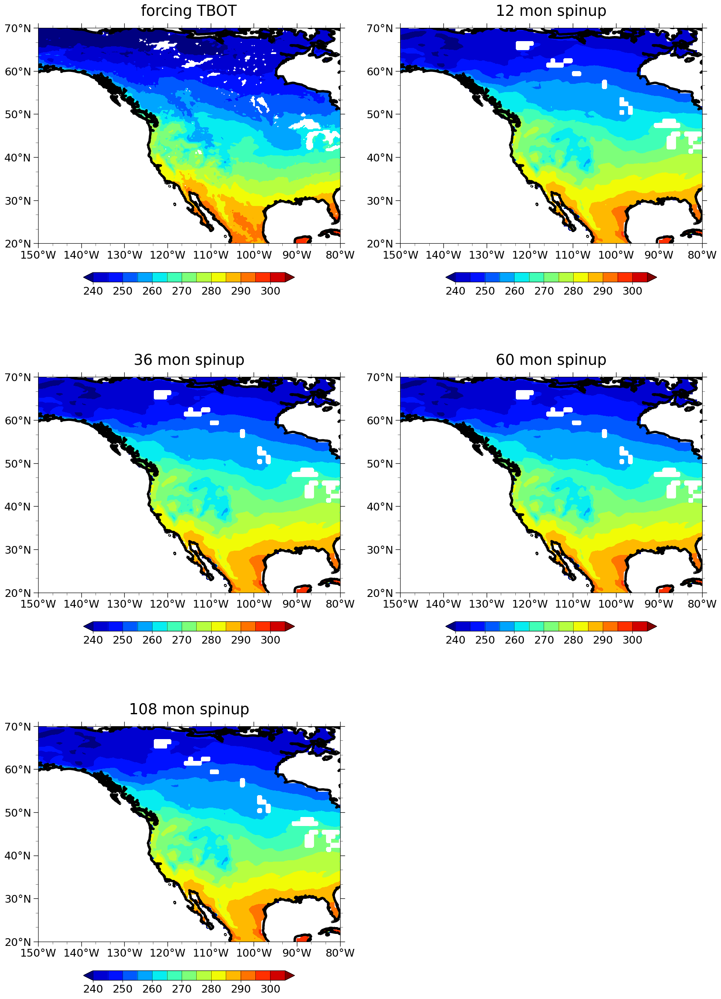

In [250]:
levels=np.arange(240,310,5)
fig=plt.figure(figsize=(20,30))

var_plot_panels(dsg.isel(time=13),'AvgSurfT_inst',3,2,1, levels,'forcing TBOT')
var_plot_panels(dsr.isel(time=11),'TSKIN',3,2,2, levels,'12 mon spinup')
var_plot_panels(dsr.isel(time=35),'TSKIN',3,2,3, levels,'36 mon spinup')
var_plot_panels(dsr.isel(time=59),'TSKIN',3,2,4, levels,'60 mon spinup')
var_plot_panels(dsr.isel(time=107),'TSKIN',3,2,5, levels,'108 mon spinup')

plt.savefig('TBOT_spinup.png')

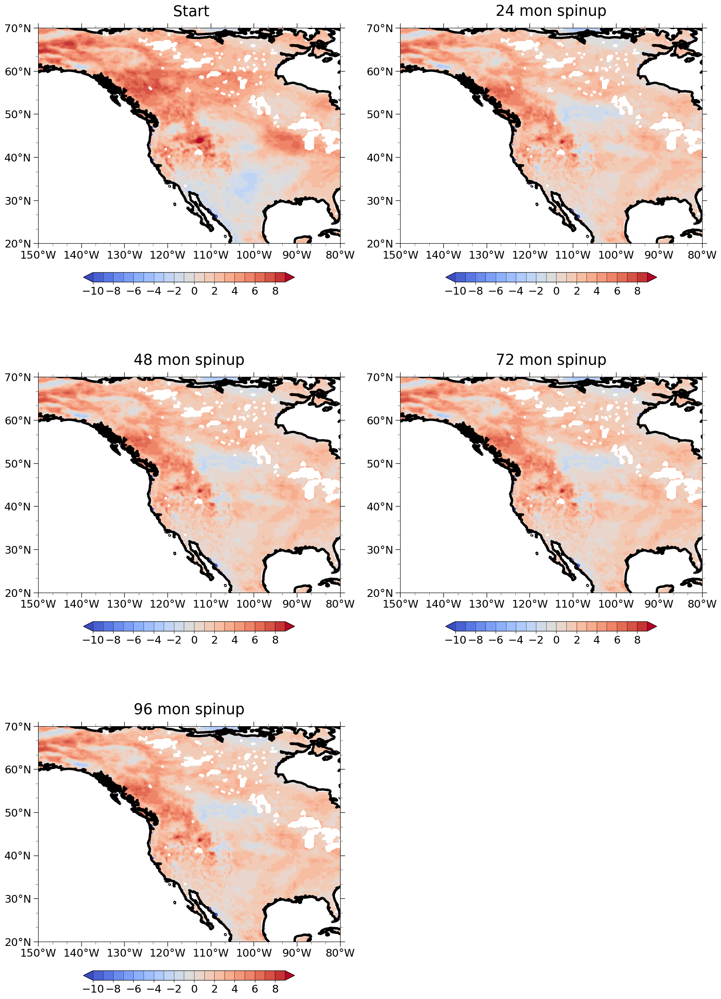

In [155]:
levels=np.arange(-10,10,1)
fig=plt.figure(figsize=(20,30))

var_plot_panels(dsr_diff.isel(time=0),'TBOT',3,2,1, levels,' Start')
var_plot_panels(dsr_diff.isel(time=24),'TBOT',3,2,2, levels,'24 mon spinup')
var_plot_panels(dsr_diff.isel(time=48),'TBOT',3,2,3, levels,'48 mon spinup')
var_plot_panels(dsr_diff.isel(time=72),'TBOT',3,2,4, levels,'72 mon spinup')
var_plot_panels(dsr_diff.isel(time=96),'TBOT',3,2,5, levels,'96 mon spinup')

plt.savefig('TBOT_spinup_diff.png')

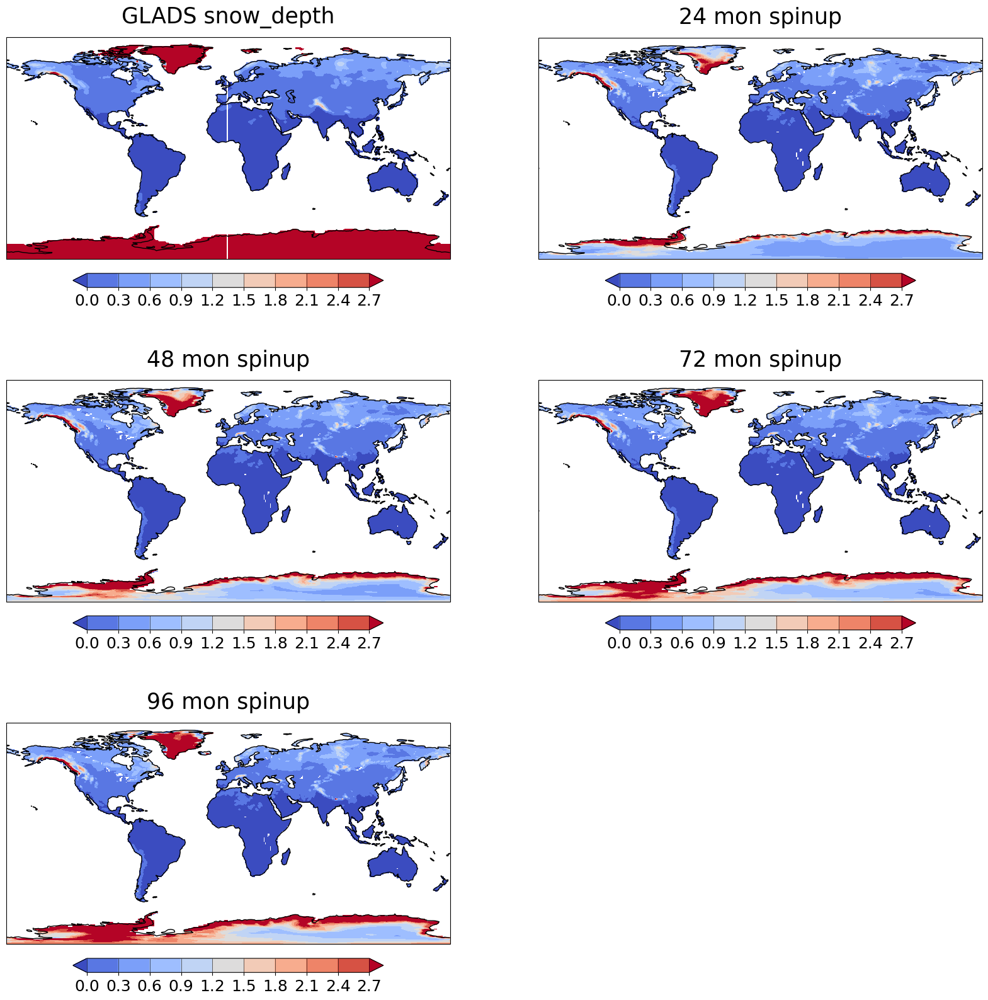

In [240]:
levels=np.arange(0,3,0.3)
fig=plt.figure(figsize=(20,20))

var_plot_panels_glob(lens.isel(time=24),'SNOW_DEPTH',3,2,1, levels,'GLADS snow_depth')
var_plot_panels_glob(dsr.isel(time=24),'SNOW_DEPTH',3,2,2, levels,'24 mon spinup')
var_plot_panels_glob(dsr.isel(time=48),'SNOW_DEPTH',3,2,3, levels,'48 mon spinup')
var_plot_panels_glob(dsr.isel(time=72),'SNOW_DEPTH',3,2,4, levels,'72 mon spinup')
var_plot_panels_glob(dsr.isel(time=96),'SNOW_DEPTH',3,2,5, levels,'96 mon spinup')

#plt.savefig('SNOWDEPTH_spinup_glob.png')

### begins

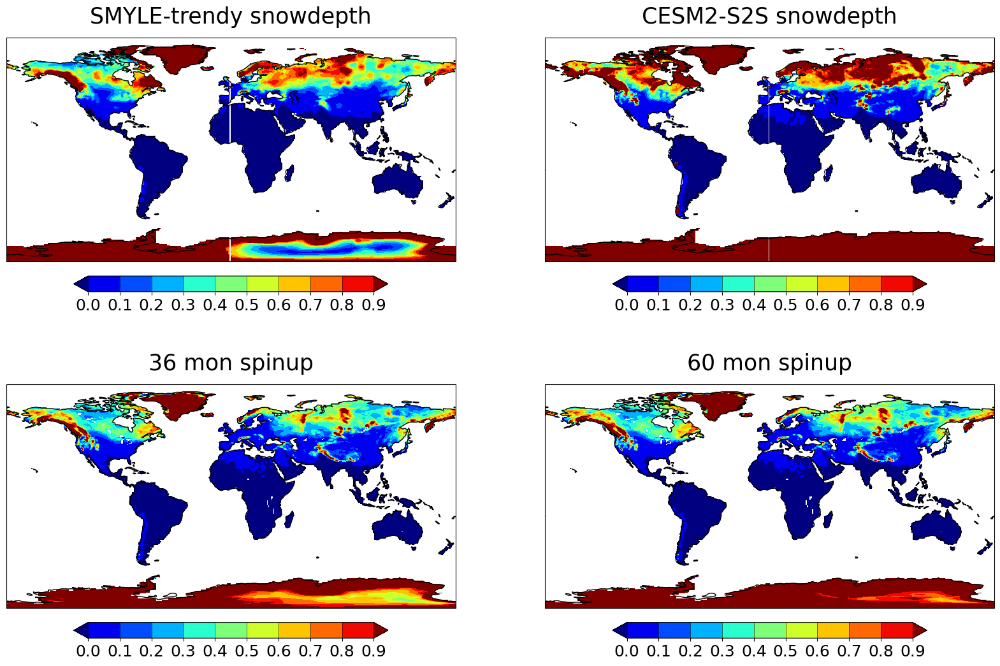

In [79]:
levels=np.arange(0,1,0.1)
fig=plt.figure(figsize=(20,20))

var1 = dtrendy_regrid.isel(time=0).SNOWDP.compute()
var2 = ds2s_regrid_feb.SNOWDP.compute()
var1 = gvutil.xr_add_cyclic_longitudes(var1, "lon")
var2 = gvutil.xr_add_cyclic_longitudes(var2, "lon")

var_plot_panels_glob(var1,3,2,1, levels,'SMYLE-trendy snowdepth','jet')
var_plot_panels_glob(var2,3,2,2, levels,'CESM2-S2S snowdepth' ,'jet')
var_plot_panels_glob(dsr.isel(time=59).SNOWDP,3,2,3, levels,'36 mon spinup','jet')
var_plot_panels_glob(dsr.isel(time=107).SNOWDP,3,2,4, levels,'60 mon spinup','jet')
#plt.savefig('SNOWDEPTH_spinup_glob_diff.png')

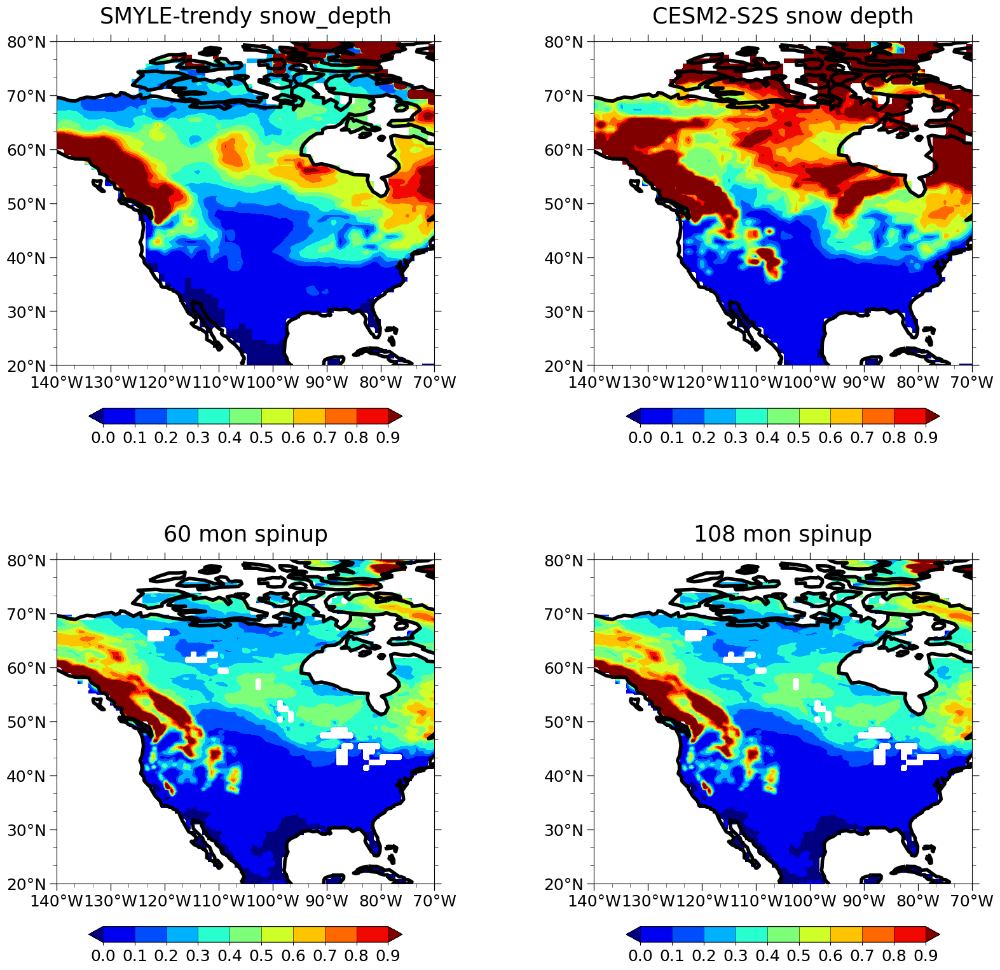

In [81]:
levels=np.arange(0,1,0.1)
fig=plt.figure(figsize=(20,30))

var_plot_panels(dtrendy_regrid.isel(time=0).SNOWDP,3,2,1, levels,'SMYLE-trendy snow_depth','jet')
var_plot_panels(ds2s_regrid_feb.SNOWDP,3,2,2,levels,'CESM2-S2S snow depth','jet')
var_plot_panels(dsr.isel(time=59).SNOWDP,3,2,3, levels,'60 mon spinup','jet')
var_plot_panels(dsr.isel(time=107).SNOWDP,3,2,4, levels,'108 mon spinup','jet')

#plt.savefig('SNOWDEPTH_spinup.png')

![snowfall](nsm_depth_2021020805_National.jpg)

## 4.. soil moisture

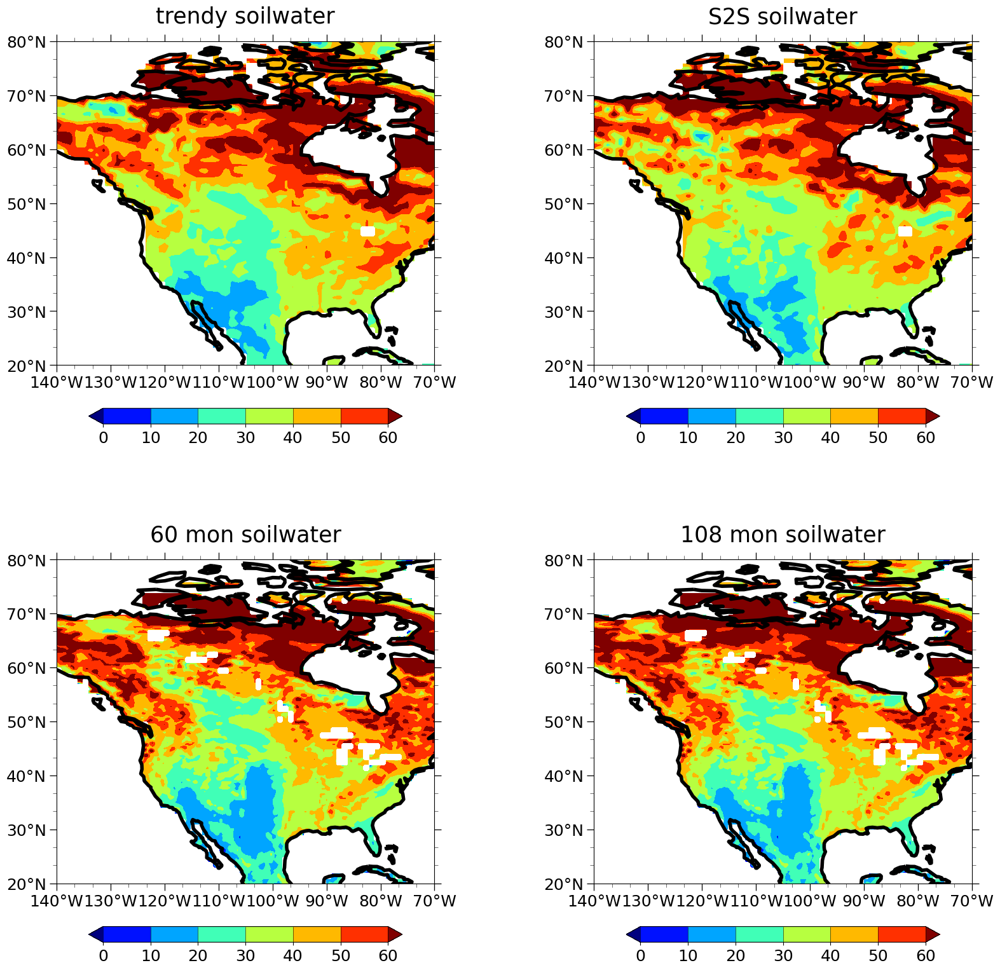

In [30]:
levels=np.arange(0,70,10)
fig=plt.figure(figsize=(20,30))

var_plot_panels(dtrendy_regrid.isel(time=0).SOILWATER_10CM,3,2,1, levels,'trendy soilwater','jet')
var_plot_panels(ds2s_regrid_feb.SOILWATER_10CM,3,2,2,levels,'S2S soilwater','jet')
var_plot_panels(dsr.isel(time=59).SOILWATER_10CM,3,2,3, levels,'60 mon soilwater','jet')
var_plot_panels(dsr.isel(time=107).SOILWATER_10CM,3,2,4, levels,'108 mon soilwater','jet')

#plt.savefig('SNOWDEPTH_spinup.png')

### 5. Time series

In [ ]:
dtrendy = xr.open_dataset('/glade/campaign/cesm/development/espwg/SMYLE/initial_conditions/CLM5_SMYLE-JRA55-Extension/hist/smyle_Transient_201801.clm2.h0.2021-02.nc')
dtrendy

In [208]:
dsg_region = dsg.where((dsg.lat<=65)&(dsg.lat>=45)&(dsg.lon>=-135)&(dsg.lon<=-110),drop=True)
#dsne30_region = dsne30.where((dsne30.lat<=65)&(dsne30.lat>=45)&(dsne30.lon>=225)&(dsne30.lon<=250),drop=True)
dsr_region = dsr.where((dsr.lat<=65)&(dsr.lat>=45)&(dsr.lon>=225)&(dsr.lon<=250),drop=True)
dsc_region = dsc.where((dsc.LATIXY<=65)&(dsc.LATIXY>=45)&(dsc.LONGXY>=225)&(dsc.LONGXY<=250),drop=True)

In [175]:
lens_region = lens.where((lens.lat<=65)&(lens.lat>=45)&(lens.lon>=225)&(lens.lon<=250),drop=True)

In [231]:
dsne30_region['time'] = dsne30_region.indexes['time'].to_datetimeindex()

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  """Entry point for launching an IPython kernel.


In [209]:
dsr_region['time'] = dsr_region.indexes['time'].to_datetimeindex() -  np.timedelta64(28,'D')
# shift the time index to the correct time

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  """Entry point for launching an IPython kernel.


In [177]:
lens_region['time'] = lens_region.indexes['time'].to_datetimeindex() 

/glade/work/huili7/miniconda3/envs/geocat_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  """Entry point for launching an IPython kernel.


Text(0.5, 0, 'time')

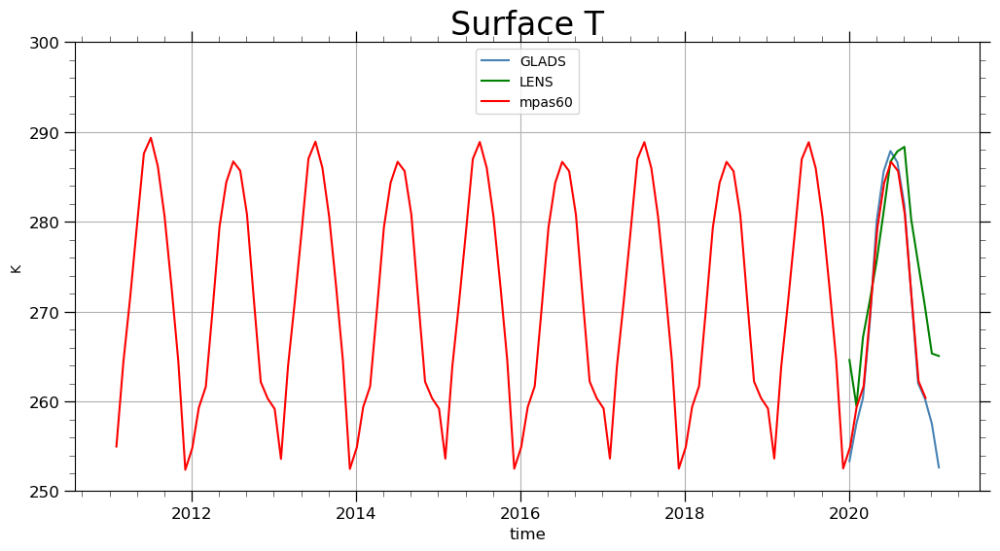

In [235]:
fig,ax = plt.subplots(figsize=(12,6))

#ax.plot(dsc_region.time,dsc_region['TBOT'].mean(('lat','lon')),color='black',label='ERA5')
ax.plot(dsg_region.time,dsg_region['AvgSurfT_inst'].mean(('lat','lon')),color='steelblue',label='GLADS')
#ax.plot(dsne30_region.time,dsne30_region['TBOT'].mean(('lat','lon')),color='orange',label='ne30')
ax.plot(lens_region.time[59:73],lens_region['TSKIN'].mean(('lat','lon'))[59:73],color='green',label='LENS')
ax.plot(dsr_region.time[0:119],dsr_region['TSKIN'][0:119].mean(('lat','lon')),color='red',label='mpas60')

gvutil.add_major_minor_ticks(ax, x_minor_per_major=6, y_minor_per_major=5, labelsize=12)
leg = plt.legend(loc='upper center')
gvutil.set_axes_limits_and_ticks(ax,ylim=(250., 300.))
ax.grid()

ax.set_title('Surface T', fontsize=24)#, pad=60.0)
ax.set_ylabel('K')
ax.set_xlabel('time',fontsize=12)

Text(0.5, 0, 'time')

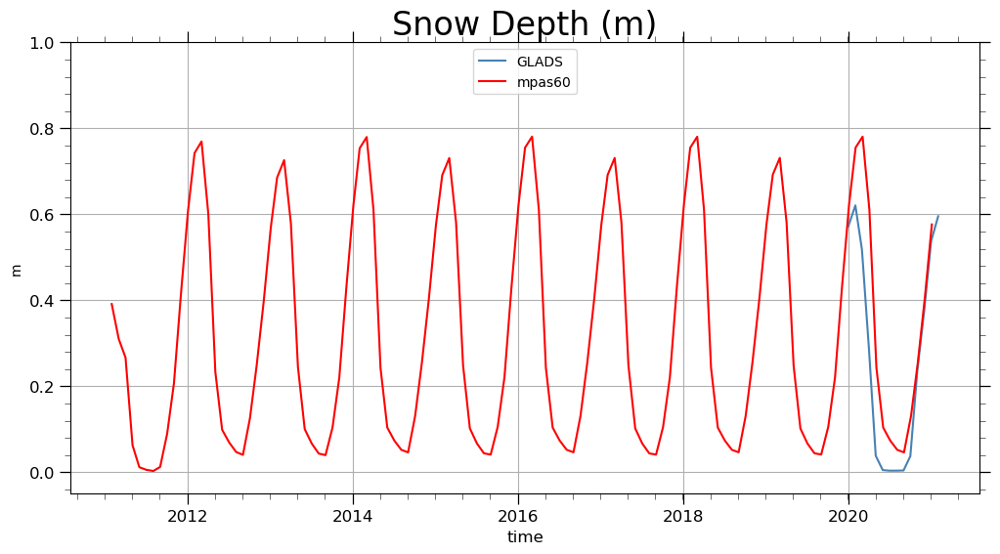

In [236]:
fig,ax = plt.subplots(figsize=(12,6))

#ax.plot(lens_region.time,lens_region['SNOW_DEPTH'].mean(('lat','lon')),color='green',label='LENS')
ax.plot(dsg_region.time,dsg_region['SnowDepth_inst'].mean(('lat','lon')),color='steelblue',label='GLADS')
ax.plot(dsr_region.time[0:120],dsr_region['SNOW_DEPTH'].mean(('lat','lon'))[0:120],color='red',label='mpas60')

gvutil.add_major_minor_ticks(ax, x_minor_per_major=6, y_minor_per_major=5, labelsize=12)
leg = plt.legend(loc='upper center')
gvutil.set_axes_limits_and_ticks(ax,ylim=(-0.05, 1.))
ax.grid()
ax.set_title('Snow Depth (m)', fontsize=24)#, pad=60.0)
ax.set_ylabel('m')
ax.set_xlabel('time',fontsize=12)

time=13 is the last element for dsg,which is 202102, in the line plot, the second to the last 202101 lines up with dsr 119
dsr 119 should be the average of Jan, with a time stamp of 0201.  which makes sense. 
so for Feb, we use dsg time=13, dsr time=120,96,72,48,24

12m = 202002-202102
24m = 202103-202112-202002

so the diff should be with time=12, 

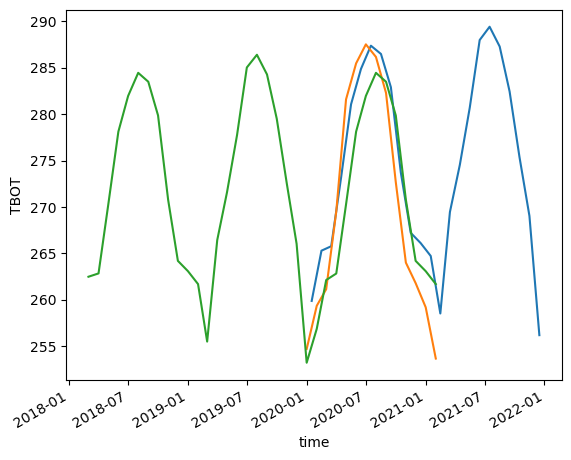

In [71]:
#dsg_region['AvgSurfT_inst'].mean(('lat','lon')).plot()
#dsne30_region['TBOT'].mean(('lat','lon')).plot()
dsc_region['TBOT'].mean(('lat','lon')).plot()
dsg_region['AvgSurfT_inst'].mean(('lat','lon')).plot()
dsne30_region['TBOT'].mean(('lat','lon')).plot()

In [117]:
dsr_region

<xarray.DataArray 'lat' ()>
array(50.0227356)

In [23]:
#50-60N, 130W-110W   230,250

<xarray.Dataset>
Dimensions:         (time: 120, hist_interval: 2, lndgrid: 163842)
Coordinates:
  * time            (time) object 2011-03-01 00:00:00 ... 2021-02-01 00:00:00
Dimensions without coordinates: hist_interval, lndgrid
Data variables:
    time_bounds     (time, hist_interval) object 2011-02-08 00:00:00 ... 2021...
    SNOW_DEPTH      (time, lndgrid) float32 ...
    SOILWATER_10CM  (time, lndgrid) float32 ...
    TBOT            (time, lndgrid) float32 ...
    TSKIN           (time, lndgrid) float32 ...
Attributes: (12/38)
    title:                                CLM History file information
    comment:                              NOTE: None of the variables are wei...
    Conventions:                          CF-1.0
    history:                              Tue Jan 23 11:36:06 2024: ncrcat -v...
    source:                               Community Terrestrial Systems Model
    hostname:                             derecho
    ...                                   ...
    ctype_urban_impervious_road:          74
    ctype_urban_pervious_road:            75
    cft_c3_crop:                          1
    cft_c3_irrigated:                     2
    time_period_freq:                     month_1
    NCO:                                  netCDF Operators version 5.1.4 (Hom...

## try to modify land use time series to repeating cycles?

## need to change the time varying variables to the value of 2020, and change the "MAX" values accordingly.

In [5]:
ds = xr.open_dataset('/glade/derecho/scratch/patc/S2S_REPO/mpasa60.S2S.L58/clm_surfdata_5_2/landuse.timeseries_mpasa60_SSP5-8.5_1850-2023_78pfts_c240509.nc')
ds


<xarray.Dataset>
Dimensions:                  (gridcell: 163842, time: 174, numurbl: 3, cft: 64,
                              natpft: 15)
Coordinates:
  * natpft                   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
  * cft                      (cft) int32 15 16 17 18 19 20 ... 73 74 75 76 77 78
  * time                     (time) int32 1850 1851 1852 1853 ... 2021 2022 2023
Dimensions without coordinates: gridcell, numurbl
Data variables: (12/25)
    LONGXY                   (gridcell) float64 ...
    LATIXY                   (gridcell) float64 ...
    PCT_URBAN                (time, numurbl, gridcell) float64 ...
    PCT_URBAN_MAX            (numurbl, gridcell) float64 ...
    PCT_LAKE                 (time, gridcell) float64 ...
    PCT_LAKE_MAX             (gridcell) float64 ...
    ...                       ...
    PCT_NAT_PFT              (time, natpft, gridcell) float64 ...
    PCT_NAT_PFT_MAX          (natpft, gridcell) float64 ...
    PCT_CFT                  (time, cft, gridcell) float64 ...
    PCT_CFT_MAX              (cft, gridcell) float64 ...
    YEAR                     (time) int32 ...
    input_pftdata_filename   (time) |S256 ...
Attributes: (12/39)
    Conventions:                          NCAR-CESM
    History_Log:                          created on: 05-10-24 03:00:16
    Source:                               Community Land Model: CLM5
    Version:                              alpha-ctsm5.2.mksrf.26_ctsm5.1.dev175
    Logname:                              patc
    Host:                                 derecho3.de.hpc.ucar.edu
    ...                                   ...
    mesh_urban_topography_file:           UNSTRUCTgrid_10x10min_nomask_cdf5_c...
    mesh_agfirepkmon_file:                UNSTRUCTgrid_0.5x0.5_nomask_cdf5_c2...
    mesh_gdp_file:                        UNSTRUCTgrid_0.5x0.5_nomask_cdf5_c2...
    mesh_peatland_file:                   UNSTRUCTgrid_0.5x0.5_nomask_cdf5_c2...
    mesh_soildepth_file:                  UNSTRUCTgrid_5x5min_nomask_cdf5_c20...
    mesh_topography_stats_file:           UGRID_1km-merge-10min_HYDRO1K-merge...

In [6]:
vars = ['PCT_URBAN','PCT_LAKE','HARVEST_VH1','HARVEST_VH2','HARVEST_SH1','HARVEST_SH2','HARVEST_SH3','GRAZING','FERTNITRO_CFT','UNREPRESENTED_PFT_LULCC','UNREPRESENTED_CFT_LULCC','LANDFRAC_MKSURFDATA','PCT_CROP','PCT_NAT_PFT','PCT_CFT'
]


In [7]:
vars

['PCT_URBAN',
 'PCT_LAKE',
 'HARVEST_VH1',
 'HARVEST_VH2',
 'HARVEST_SH1',
 'HARVEST_SH2',
 'HARVEST_SH3',
 'GRAZING',
 'FERTNITRO_CFT',
 'UNREPRESENTED_PFT_LULCC',
 'UNREPRESENTED_CFT_LULCC',
 'LANDFRAC_MKSURFDATA',
 'PCT_CROP',
 'PCT_NAT_PFT',
 'PCT_CFT']

In [14]:
ds.PCT_NAT_PFT[0]

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 15, gridcell: 163842)>
[2457630 values with dtype=float64]
Coordinates:
  * natpft   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
    time     int32 1850
Dimensions without coordinates: gridcell
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

In [26]:
#vars_with_time = [name for name in ds.variables if "time" in ds[name].dims]


In [81]:
ds_new = ds.copy(deep=True)

In [82]:
len(vars)

15

In [83]:
ntime = ds[vars].time.size


In [41]:
ds.where(ds.time>170,drop=True)


KeyboardInterrupt



In [84]:
np.arange(0, ntime-3)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170])

In [90]:
ntime = ds[vars].time.size
# change everytihng to 2020 up until the year of 2020

for ivar in np.arange(len(vars)):
    print(vars[ivar])
    for it in np.arange(0, ntime-3):
        ds_new[vars[ivar]][it] = ds[vars[ivar]].sel(time=2020).data


PCT_URBAN
PCT_LAKE
HARVEST_VH1
HARVEST_VH2
HARVEST_SH1
HARVEST_SH2
HARVEST_SH3
GRAZING
FERTNITRO_CFT
UNREPRESENTED_PFT_LULCC
UNREPRESENTED_CFT_LULCC
LANDFRAC_MKSURFDATA
PCT_CROP
PCT_NAT_PFT
PCT_CFT


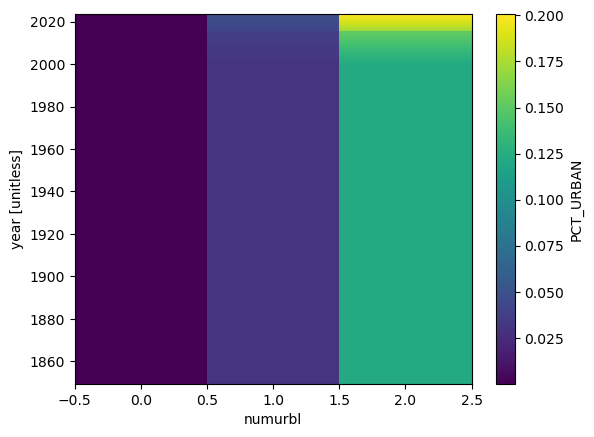

In [15]:
ds_new['PCT_URBAN'].mean('gridcell').plot()


In [92]:
ds_new.to_netcdf('landuse.timeseries_mpasa60_SSP5-8.5_1850-2023_78pfts_c240509_2020cycle.nc')
#ds_cycle = xr.open_dataset('../landuse.timeseries_mpasa60_SSP5-8.5_1850-2023_78pfts_c240509_2020cycle.nc')
#ds_cycle

In [16]:
ds2 = xr.open_dataset('/glade/derecho/scratch/patc/S2S_REPO/mpasa60.S2S.L58/clm_surfdata_5_2/surfdata_mpasa60_SSP5-8.5_2020_78pfts_c240510.nc')
ds2                    

<xarray.Dataset>
Dimensions:                  (gridcell: 163842, nlevsoi: 10, numurbl: 3,
                              numrad: 2, nlevurb: 10, nglcecp1: 11, nglcec: 10,
                              cft: 64, natpft: 15, time: 12, lsmpft: 79)
Coordinates:
  * natpft                   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
  * cft                      (cft) int32 15 16 17 18 19 20 ... 73 74 75 76 77 78
  * time                     (time) int32 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: gridcell, nlevsoi, numurbl, numrad, nlevurb,
                                nglcecp1, nglcec, lsmpft
Data variables: (12/82)
    LONGXY                   (gridcell) float64 ...
    LATIXY                   (gridcell) float64 ...
    mxsoil_color             int32 ...
    SOIL_COLOR               (gridcell) int32 ...
    PCT_SAND                 (nlevsoi, gridcell) float32 ...
    PCT_CLAY                 (nlevsoi, gridcell) float32 ...
    ...                       ...
    PCT_NAT_PFT              (natpft, gridcell) float64 ...
    PCT_CFT                  (cft, gridcell) float64 ...
    MONTHLY_LAI              (time, lsmpft, gridcell) float64 ...
    MONTHLY_SAI              (time, lsmpft, gridcell) float64 ...
    MONTHLY_HEIGHT_TOP       (time, lsmpft, gridcell) float64 ...
    MONTHLY_HEIGHT_BOT       (time, lsmpft, gridcell) float64 ...
Attributes: (12/45)
    Conventions:                              NCAR-CESM
    History_Log:                              created on: 05-10-24 13:13:41
    Source:                                   Community Land Model: CLM5
    Version:                                  alpha-ctsm5.2.mksrf.26_ctsm5.1....
    Logname:                                  patc
    Host:                                     derecho3.de.hpc.ucar.edu
    ...                                       ...
    lai_raw_data_file_name:                   mksrf_pftlaihgt_ctsm52_histLUH2...
    soil_color_raw_data_file_name:            mksrf_soilcolor_ctsm52_histLUH2...
    soil_texture_mapunit_raw_data_file_name:  mksrf_soil_mapunits_5x5min_WISE...
    soil_texture_lookup_raw_data_file_name:   mksrf_soil_lookup.10level.WISE....
    fmax_raw_data_file_name:                  mksrf_fmax_0.125x0.125_c200220.nc
    VOC_EF_raw_data_file_name:                mksrf_vocef_0.5x0.5_simyr2000.c...

In [18]:
ds2.PCT_NAT_PFT.data

array([[100.        ,  42.92993388, 100.        , ..., 100.        ,
        100.        , 100.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.15165329,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  18.98441923,   0.        , ...,   0.        ,
          0.        ,   0.        ]])

In [56]:
ds.sel(time=2020).PCT_NAT_PFT.data

array([[100.        ,  42.92993388, 100.        , ..., 100.        ,
        100.        , 100.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.15165329,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  18.98441923,   0.        , ...,   0.        ,
          0.        ,   0.        ]])

In [47]:
ds_cycle.PCT_NAT_PFT.sel(time=2020)

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 15, gridcell: 163842)>
array([[100.      ,  42.929934, 100.      , ..., 100.      , 100.      ,
        100.      ],
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       ...,
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,   0.151653,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,  18.984419,   0.      , ...,   0.      ,   0.      ,
          0.      ]])
Coordinates:
  * natpft   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
    time     int32 2020
Dimensions without coordinates: gridcell
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

In [88]:
ds_new.PCT_NAT_PFT[0] = 0

In [91]:
ds_new['PCT_NAT_PFT'].isel(time=0)[:].data

array([[100.        ,  42.92993388, 100.        , ..., 100.        ,
        100.        , 100.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.15165329,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  18.98441923,   0.        , ...,   0.        ,
          0.        ,   0.        ]])

In [73]:
ds_new['PCT_NAT_PFT'].isel(time=0)[:].data

array([[100.        ,  42.92360688, 100.        , ..., 100.        ,
        100.        , 100.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.14922999,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  18.98777174,   0.        , ...,   0.        ,
          0.        ,   0.        ]])

In [80]:
ds_new['PCT_NAT_PFT'].isel(time=0).data

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [77]:
ds_new['PCT_NAT_PFT'][0,:,:] = 0 #ds['PCT_NAT_PFT'].sel(time=2020).data

In [70]:
ds['PCT_NAT_PFT'].sel(time=2020)

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 15, gridcell: 163842)>
[2457630 values with dtype=float64]
Coordinates:
  * natpft   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
    time     int32 2020
Dimensions without coordinates: gridcell
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

In [57]:
ds['PCT_NAT_PFT'].sel(time=2020).data

array([[100.        ,  42.92993388, 100.        , ..., 100.        ,
        100.        , 100.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.15165329,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  18.98441923,   0.        , ...,   0.        ,
          0.        ,   0.        ]])